In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch import nn
import torchvision
from torchvision import datasets
import os
from pathlib import Path
import random
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms , datasets
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader
from tqdm.auto import tqdm 
from timeit import default_timer as timer
from torch.autograd import Variable
import warnings
warnings.filterwarnings('ignore')

In [ ]:
print(f'The version of torch is : {torch.__version__}\nThe version of torchvision is : {torchvision.__version__}')

Fri Nov 14 19:27:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.133.07             Driver Version: 570.133.07     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050 ...    Off |   00000000:01:00.0 Off |                  N/A |
| N/A   49C    P8              6W /   35W |      18MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [5]:
def check_diractory(directory_path):
                                 
    for dirpath , dirname , filename in os.walk(directory_path):
        print(f"There are {len(dirname)} directories and {len(filename)} images in '{dirpath}'.")

In [ ]:
d_Train = "archive-intel/seg_train"
d_Test = "archive-intel/seg_test"
d_pred = "archive-intel/seg_pred"

train_dir = d_Train + "/seg_train"
test_dir = d_Test + "/seg_test/"
prediction_dir = d_pred + '/seg_pred'




archive-intel/seg_train/seg_train


In [11]:
Image_path_Test = Path(test_dir)
check_diractory(Image_path_Test)

There are 6 directories and 0 images in 'archive-intel/seg_test/seg_test'.
There are 0 directories and 474 images in 'archive-intel/seg_test/seg_test/forest'.
There are 0 directories and 525 images in 'archive-intel/seg_test/seg_test/mountain'.
There are 0 directories and 437 images in 'archive-intel/seg_test/seg_test/buildings'.
There are 0 directories and 553 images in 'archive-intel/seg_test/seg_test/glacier'.
There are 0 directories and 510 images in 'archive-intel/seg_test/seg_test/sea'.
There are 0 directories and 501 images in 'archive-intel/seg_test/seg_test/street'.


In [10]:
Image_path_Train = Path(train_dir)
check_diractory(Image_path_Train)

There are 6 directories and 0 images in 'archive-intel/seg_train/seg_train'.
There are 0 directories and 2271 images in 'archive-intel/seg_train/seg_train/forest'.
There are 0 directories and 2512 images in 'archive-intel/seg_train/seg_train/mountain'.
There are 0 directories and 2191 images in 'archive-intel/seg_train/seg_train/buildings'.
There are 0 directories and 2404 images in 'archive-intel/seg_train/seg_train/glacier'.
There are 0 directories and 2274 images in 'archive-intel/seg_train/seg_train/sea'.
There are 0 directories and 2382 images in 'archive-intel/seg_train/seg_train/street'.


In [12]:
train_dir , test_dir , prediction_dir


('archive-intel/seg_train/seg_train',
 'archive-intel/seg_test/seg_test/',
 'archive-intel/seg_pred/seg_pred')

The path   of the random image  is : archive-intel/seg_train/seg_train/sea/18559.jpg
The class  of the random image  is : sea
The height of the random image  is : 150
The width  of the random image  is : 150


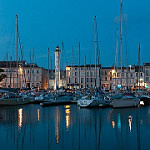

In [14]:
random.seed(42)

list_image_path = list(Path(train_dir).glob('*/*.jpg'))

Random_Image_Path = random.choice(list_image_path)

img = Image.open(Random_Image_Path)

print(f'The path   of the random image  is : {Random_Image_Path}')
print(f'The class  of the random image  is : {Random_Image_Path.parent.stem}')
print(f'The height of the random image  is : {img.height}')
print(f'The width  of the random image  is : {img.width}')
img


In [16]:
train_transforms = transforms.Compose([
    transforms.Resize(size=(150 , 150)) ,
    transforms.ColorJitter(0.4,0.5,0.5,0.2),
    transforms.RandomHorizontalFlip(p=0.5) , 
    transforms.RandomCrop(size=(150,150)),  
    transforms.ToTensor(),
    transforms.Normalize((0.425, 0.415, 0.405), (0.205, 0.205, 0.205))
])



test_transforms = transforms.Compose([
    transforms.Resize((150, 150)), 
    transforms.ToTensor(),
    transforms.Normalize((0.425, 0.415, 0.405), (0.255, 0.245, 0.235))
])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7862267..0.5686276].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.073171..2.5284553].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.073171..2.902439].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.073171..2.902439].


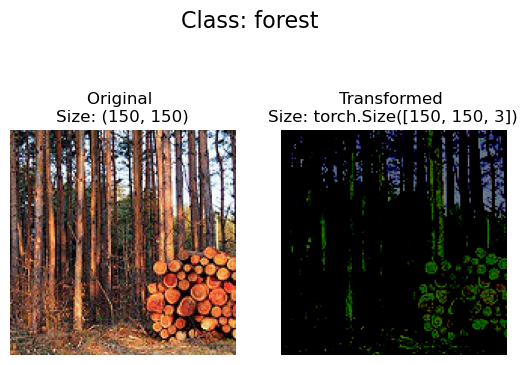

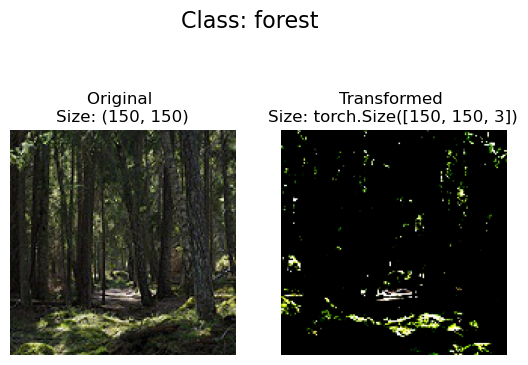

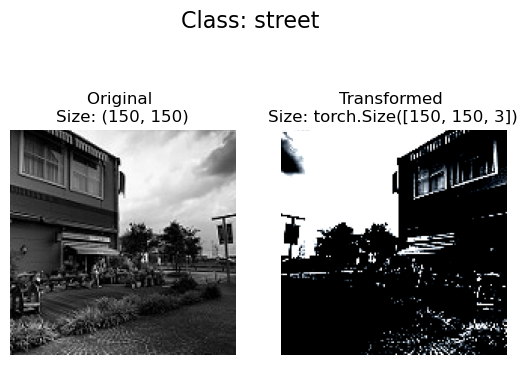

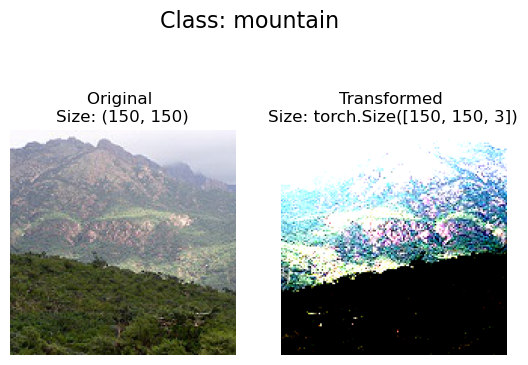

In [17]:
def show_transformed_images(path , transform , number=4 ,seed = 42):
    
    random.seed = seed
    random_image = random.sample(path , number)
    for path in random_image:
        with Image.open(path) as f :
            fig , ax = plt.subplots(1,2)      
            ax[0].imshow(f) 
            ax[0].set_title(f"Original \nSize: {f.size}")
            ax[0].axis("off")
            
            transformed_image = transform(f).permute(1, 2, 0) 
            ax[1].imshow(transformed_image) 
            ax[1].set_title(f"Transformed \nSize: {transformed_image.shape}")
            ax[1].axis("off")
            fig.suptitle(f"Class: {path.parent.stem}", fontsize=16)
            
show_transformed_images(path=list_image_path , 
                        transform=train_transforms, 
                        number=4)


In [18]:
train_data = datasets.ImageFolder(root=train_dir , transform = train_transforms )
test_data = datasets.ImageFolder(root=test_dir , transform=test_transforms )
print(f'Train data : {train_data}\n\n\nTest data : {test_data}')


Train data : Dataset ImageFolder
    Number of datapoints: 14034
    Root location: archive-intel/seg_train/seg_train
    StandardTransform
Transform: Compose(
               Resize(size=(150, 150), interpolation=bilinear, max_size=None, antialias=True)
               ColorJitter(brightness=(0.6, 1.4), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=(-0.2, 0.2))
               RandomHorizontalFlip(p=0.5)
               RandomCrop(size=(150, 150), padding=None)
               ToTensor()
               Normalize(mean=(0.425, 0.415, 0.405), std=(0.205, 0.205, 0.205))
           )


Test data : Dataset ImageFolder
    Number of datapoints: 3000
    Root location: archive-intel/seg_test/seg_test/
    StandardTransform
Transform: Compose(
               Resize(size=(150, 150), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=(0.425, 0.415, 0.405), std=(0.255, 0.245, 0.235))
           )


In [ ]:
from networkx import NodeNotFound


def class_finder(directory):
    classes = sorted(i.name for i in os.scandir(directory) if i.is_dir())
    if not classes:
        raise NodeNotFound(f'This directory dose not have any classes : {directory}')
    class_to_inx = {name : value for name , value in enumerate(classes) }
    
    return  classes , class_to_inx

In [ ]:
class ImageFolderCustom(Dataset):
    
    
    def __init__(self , target_dir , transform ):
        
        self.paths = list(Path(target_dir).glob('*/*.jpg'))
        
        self.transform = transform
        
        self.classes , self.classes_to_inx = class_finder(target_dir)
    
    def load_image(self, index):
        
        image_path = self.paths[index]
        
        return Image.open(image_path)
    
    
    def __len__(self):
        
        return len(self.paths)
    
    
    
    def __getitem__(self , indx):
        
        img = self.load_image(indx)
        
        class_name = self.paths[indx].parent.name
        
        class_inx = self.class_to_idx[class_name]
        
        if self.transform:
            return self.transform(img), class_inx 
        else:
            return img, class_inx 

In [23]:
train_data_custom = ImageFolderCustom(target_dir=train_dir, 
                                      transform=train_transforms)
test_data_custom = ImageFolderCustom(target_dir= test_dir, 
                                     transform=test_transforms)
train_data_custom, test_data_custom


(<__main__.ImageFolderCustom at 0x7a8a158cb620>,
 <__main__.ImageFolderCustom at 0x7a8aec224910>)

In [24]:
print(f'The len of train data is : {len(train_data_custom)}\nThe len of test  data is : {len(test_data_custom)}')


The len of train data is : 14034
The len of test  data is : 3000


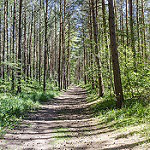

In [25]:
train_data_custom.load_image(100)


In [26]:
print(f'The number of classes are : {len(train_data_custom.classes)}')
train_data_custom.classes

The number of classes are : 6


['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [27]:
train_data_custom.classes_to_inx


{0: 'buildings',
 1: 'forest',
 2: 'glacier',
 3: 'mountain',
 4: 'sea',
 5: 'street'}

In [28]:
size_valid = 0.10

number_train = len(train_data_custom)
indx = list(range(number_train))

np.random.shuffle(indx)
split = int(size_valid * number_train)

train_idx, valid_idx = indx[split:], indx[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

In [29]:
train_dataloader = DataLoader(dataset= train_data , 
                              batch_size= 32 ,  
                              num_workers=0,
                              sampler=train_sampler  
                              )
                             
valid_dataloader = DataLoader(dataset=train_data , 
                             batch_size=32 , 
                             num_workers=0,
                             sampler=valid_sampler                            
                             )

test_dataloader = DataLoader(dataset=test_data,
                            batch_size=32,
                            num_workers=0,
                            shuffle=False)

In [30]:
img , label = next(iter(train_dataloader))
# img
print(f'The shape is : {img.shape} [batch-size , color-channels , height , width]')
print(f'The label shape is : {label.shape}')

The shape is : torch.Size([32, 3, 150, 150]) [batch-size , color-channels , height , width]
The label shape is : torch.Size([32])


In [31]:
Model = torchvision.models.wide_resnet50_2(pretrained=True)

for param in Model.parameters():
    param.required_grad = False
    
number_feature = Model.fc.in_features
Model.fc = nn.Linear(in_features=number_feature , out_features=len(train_data.classes))

Downloading: "https://download.pytorch.org/models/wide_resnet50_2-95faca4d.pth" to /home/vighnesh/.cache/torch/hub/checkpoints/wide_resnet50_2-95faca4d.pth
100%|██████████| 132M/132M [00:50<00:00, 2.71MB/s] 


In [32]:
Model.fc
Model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), strid

In [33]:
ss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=Model.parameters() , lr = 0.01)
schedul_learning = torch.optim.lr_scheduler.MultiStepLR(optimizer=optimizer , milestones=[3 , 6 ] ,
                                                        gamma=0.055)

In [36]:
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(params=Model.parameters() , lr = 0.01)
schedul_learning = torch.optim.lr_scheduler.MultiStepLR(optimizer=optimizer , milestones=[3 , 6 ] ,
                                                        gamma=0.055)

In [43]:
st_time = timer()
epochs = 10


valid_loss_min = np.inf
Valid_loss = []
Train_loss = []

for epoch in tqdm(range(1,epochs+1)):

    
    train_loss  = 0.0 
    valid_loss  = 0.0 

    #train
    Model.train()
    
    for batch , (X, y) in enumerate(train_dataloader):       
       
        
        X, y = X.to(device), y.to(device)
       
        optimizer.zero_grad()
       
        y_pred = Model(X)
       
        loss = loss_function(y_pred , y)
        
        
        loss.backward()
        
        optimizer.step()
        
        
        train_loss += loss.item()*X.size(0)

    

    torch.cuda.empty_cache()
    
    Model.eval()
    with torch.no_grad():
        for batch , (X, y) in enumerate(valid_dataloader):
            X , y = X.to(device), y.to(device)
            y_pred = Model(X)
            loss = loss_function(y_pred, y)
            valid_loss += loss.item() * X.size(0)
  
        
       
    train_loss = train_loss/len(train_dataloader.sampler)
    valid_loss = valid_loss/len(valid_dataloader.sampler)
    Valid_loss.append(valid_loss)
    Train_loss.append(train_loss)
   
    schedul_learning.step()
    schedul_learning
    end_time = timer()
   
    print('Epoch: {} \nTraining Loss: {:.3f} \nValidation Loss: {:.3f}'.format(epoch, train_loss, valid_loss))
    
  
    if valid_loss <= valid_loss_min:
        
        print("Decrease Validation Loss {:.4f} : {:.4f} ".format(valid_loss_min, valid_loss))
        torch.save(Model.state_dict(), 'My_Model.pt')
        valid_loss_min = valid_loss
        
    print('Learning Rate : {:.4f}'.format(optimizer.state_dict()['param_groups'][0]['lr']))
    print('\nTime : {:.2f}'.format(end_time - st_time))
    print('----------------------------------')
    


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 
Training Loss: 0.215 
Validation Loss: 0.189
Decrease Validation Loss inf : 0.1892 
Learning Rate : 0.0100

Time : 152.87
----------------------------------
Epoch: 2 
Training Loss: 0.159 
Validation Loss: 0.182
Decrease Validation Loss 0.1892 : 0.1817 
Learning Rate : 0.0100

Time : 307.85
----------------------------------
Epoch: 3 
Training Loss: 0.118 
Validation Loss: 0.218
Learning Rate : 0.0006

Time : 464.15
----------------------------------
Epoch: 4 
Training Loss: 0.077 
Validation Loss: 0.183
Learning Rate : 0.0006

Time : 620.65
----------------------------------
Epoch: 5 
Training Loss: 0.076 
Validation Loss: 0.192
Learning Rate : 0.0006

Time : 777.28
----------------------------------
Epoch: 6 
Training Loss: 0.071 
Validation Loss: 0.203
Learning Rate : 0.0000

Time : 942.24
----------------------------------
Epoch: 7 
Training Loss: 0.071 
Validation Loss: 0.197
Learning Rate : 0.0000

Time : 1162.27
----------------------------------
Epoch: 8 
Training Los

In [40]:
torch.cuda.empty_cache()

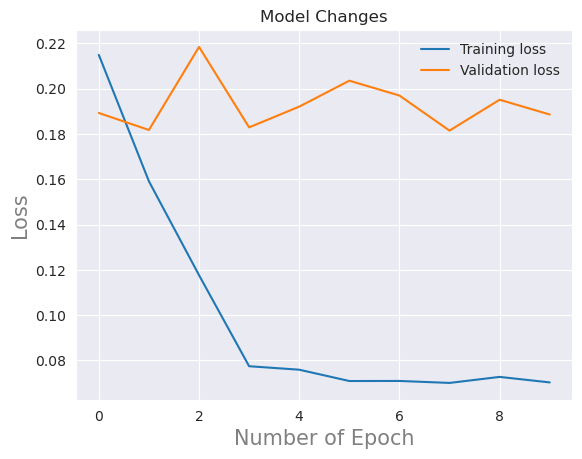

In [44]:
sns.set_style('darkgrid')
plt.plot(Train_loss, label='Training loss')
plt.plot(Valid_loss, label='Validation loss')
plt.legend(frameon=False)
plt.xlabel('Number of Epoch' , size = 15 , c = 'gray')
plt.ylabel('Loss' , size = 15 , c='gray')
plt.title('Model Changes')
plt.show()

In [45]:
Model.load_state_dict(torch.load('My_Model.pt'))
Model.eval()
Model.cuda()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), strid

Prediction

In [46]:
single_img, all_img = 0,0

for images, labels in test_dataloader:
    for i in range(len(labels)):
        images = images.cuda()
        labels = labels.cuda()
        img = images[i].view(1,3,150,150)
        
        with torch.no_grad():
            logps = Model(img)
            
        ps = torch.exp(logps)
        probab = list(ps.cpu()[0])
        pred_label = probab.index(max(probab))
        true_label = labels.cpu()[i]
        if(true_label == pred_label):
            single_img += 1
        all_img += 1
        
print(f'There are {all_img} in test')
print(f'The model accuracy is :{round((single_img/all_img)*100  , 2)}')

There are 3000 in test
The model accuracy is :93.77


In [47]:
def pred_class(img):
    
    img_tens = test_transforms(img)
    img_im = img_tens.unsqueeze(0).cuda() 
    uinput = Variable(img_im)
    uinput = uinput.to(device)
    out = Model(uinput)
    index = out.data.cpu().numpy().argmax()    
    return index

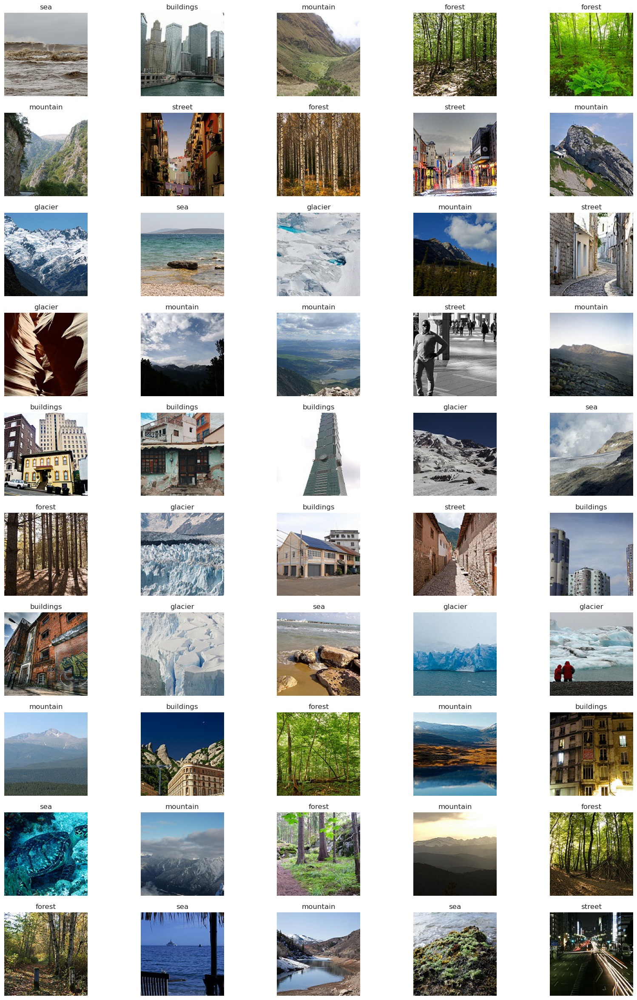

In [50]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# class index mapping
classes = {idx: cls for idx, cls in enumerate(sorted(train_data_custom.classes))}

Model.eval()

# folder containing prediction images
prediction_dir = "archive-intel/seg_pred/seg_pred"

# get full file paths, filter only images
valid_ext = (".jpg", ".jpeg", ".png")

prediction_images = [
    os.path.join(prediction_dir, f)
    for f in os.listdir(prediction_dir)
    if os.path.isfile(os.path.join(prediction_dir, f)) and f.lower().endswith(valid_ext)
]

plt.figure(figsize=(20, 30))

for i, img_path in enumerate(prediction_images):
    if i >= 50:
        break
    
    img = Image.open(img_path)
    index = pred_class(img)

    plt.subplot(10, 5, i + 1)
    plt.title(classes[index])
    plt.axis("off")
    plt.imshow(img)


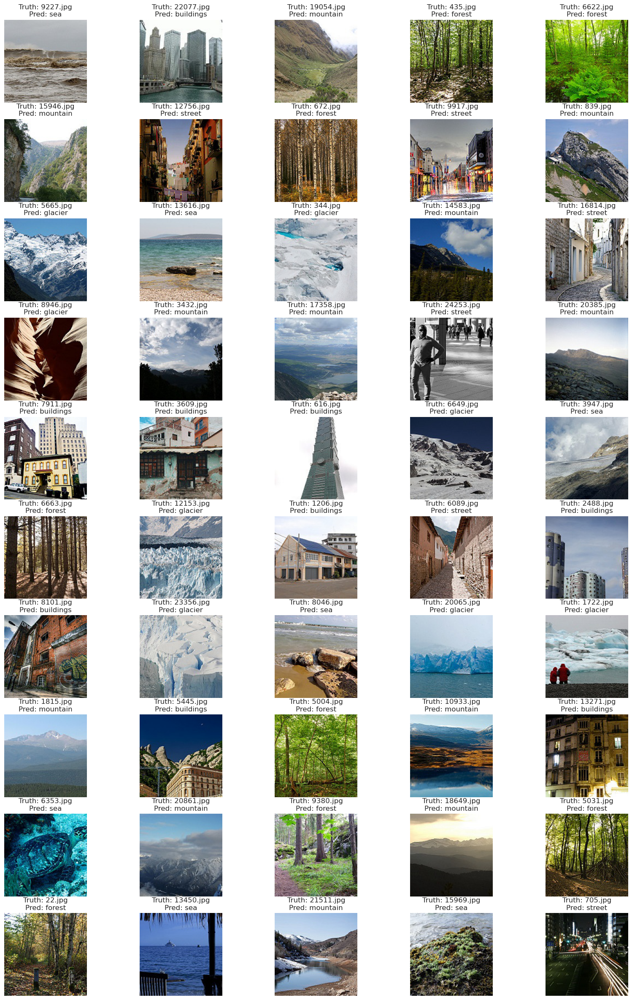

In [58]:
import os
from PIL import Image
import matplotlib.pyplot as plt

Model.eval()

# Folder with prediction images
prediction_dir = "archive-intel/seg_pred/seg_pred"

valid_ext = (".jpg", ".jpeg", ".png")

# List all full image paths
prediction_images = [
    os.path.join(prediction_dir, f)
    for f in os.listdir(prediction_dir)
    if f.lower().endswith(valid_ext)
]

plt.figure(figsize=(20, 30))

for i, img_path in enumerate(prediction_images):
    if i >= 50:
        break
    
    img = Image.open(img_path)

    # Your prediction function
    pred_idx = pred_class(img)
    pred_label = classes[pred_idx]

    # Example: extract GT from filename ("forest_23.jpg")
    true_label = os.path.basename(img_path).split("_")[0]

    plt.subplot(10, 5, i + 1)
    plt.title(f"Truth: {true_label}\nPred: {pred_label}")
    plt.axis("off")
    plt.imshow(img)


In [57]:

prediction_dir = "archive-intel/seg_pred/seg_pred"

print("Prediction dir exists:", os.path.isdir(prediction_dir))
print("Contents:", os.listdir(prediction_dir))


Prediction dir exists: True
Contents: ['9227.jpg', '22077.jpg', '19054.jpg', '435.jpg', '6622.jpg', '15946.jpg', '12756.jpg', '672.jpg', '9917.jpg', '839.jpg', '5665.jpg', '13616.jpg', '344.jpg', '14583.jpg', '16814.jpg', '8946.jpg', '3432.jpg', '17358.jpg', '24253.jpg', '20385.jpg', '7911.jpg', '3609.jpg', '616.jpg', '6649.jpg', '3947.jpg', '6663.jpg', '12153.jpg', '1206.jpg', '6089.jpg', '2488.jpg', '8101.jpg', '23356.jpg', '8046.jpg', '20065.jpg', '1722.jpg', '1815.jpg', '5445.jpg', '5004.jpg', '10933.jpg', '13271.jpg', '6353.jpg', '20861.jpg', '9380.jpg', '18649.jpg', '5031.jpg', '22.jpg', '13450.jpg', '21511.jpg', '15969.jpg', '705.jpg', '23581.jpg', '93.jpg', '22523.jpg', '15766.jpg', '12949.jpg', '4248.jpg', '2317.jpg', '23904.jpg', '7918.jpg', '6322.jpg', '15662.jpg', '3421.jpg', '21953.jpg', '9837.jpg', '9500.jpg', '4185.jpg', '8057.jpg', '3776.jpg', '14801.jpg', '2845.jpg', '3996.jpg', '9727.jpg', '11726.jpg', '14306.jpg', '24117.jpg', '7917.jpg', '12246.jpg', '14768.jpg', '4

In [59]:
import torch
import torch.nn.functional as F
from torchvision import transforms
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        
        self.gradients = None
        self.activations = None
        
        # hook for gradients
        def save_gradient(module, grad_input, grad_output):
            self.gradients = grad_output[0]
        
        # hook for activations
        def save_activation(module, input, output):
            self.activations = output
        
        target_layer.register_forward_hook(save_activation)
        target_layer.register_backward_hook(save_gradient)

    def generate(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)

        if class_idx is None:
            class_idx = torch.argmax(output, dim=1).item()
        
        target = output[0, class_idx]
        target.backward()

        gradients = self.gradients[0].cpu().data.numpy()
        activations = self.activations[0].cpu().data.numpy()

        weights = np.mean(gradients, axis=(1, 2))
        cam = np.zeros(activations.shape[1:], dtype=np.float32)

        for w, act in zip(weights, activations):
            cam += w * act

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (224, 224))
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        return cam


In [60]:
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])


In [63]:
def show_gradcam(model, cam_generator, img_path, classes):
    original = Image.open(img_path).convert("RGB")
    img_tensor = transform(original).unsqueeze(0).to(next(model.parameters()).device)

    # prediction index
    pred_idx = torch.argmax(model(img_tensor)).item()
    pred_label = classes[pred_idx]

    cam = cam_generator.generate(img_tensor, class_idx=pred_idx)

    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    
    original_np = np.array(original.resize((224, 224)))
    overlay = np.uint8(0.4 * heatmap + 0.6 * original_np)

    plt.figure(figsize=(10,4))
    
    plt.subplot(1,2,1)
    plt.title(f"Prediction: {pred_label}")
    plt.axis("off")
    plt.imshow(original_np)

    plt.subplot(1,2,2)
    plt.title("Grad-CAM")
    plt.axis("off")
    plt.imshow(overlay)
    
    plt.show()


In [64]:
target_layer = Model.layer4[1].conv2
cam_generator = GradCAM(Model, target_layer)


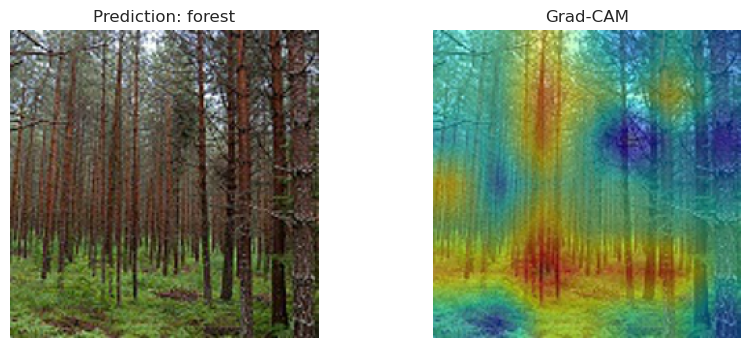

In [67]:
img_path = "archive-intel/seg_pred/seg_pred/183.jpg"
show_gradcam(Model, cam_generator, img_path, classes)

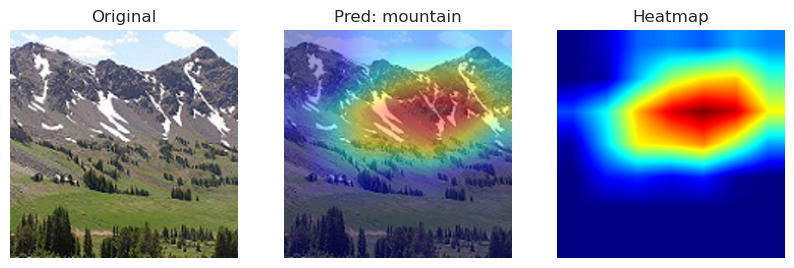

In [71]:
import torch
import torch.nn.functional as F
from torchvision import transforms
import numpy as np
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# --- GradCAM class (hooks for activations + gradients) ---
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        # forward hook to save activations
        def forward_hook(module, inp, out):
            self.activations = out.detach()
        # backward hook to save gradients
        def backward_hook(module, grad_in, grad_out):
            # grad_out[0] corresponds to gradients w.r.t. the layer output
            self.gradients = grad_out[0].detach()

        target_layer.register_forward_hook(forward_hook)
        target_layer.register_backward_hook(backward_hook)

    def generate(self, input_tensor, class_idx=None):
        self.model.zero_grad()
        output = self.model(input_tensor)            # shape [1, num_classes]
        if class_idx is None:
            class_idx = int(output.argmax(dim=1)[0])

        target = output[0, class_idx]
        target.backward(retain_graph=True)

        grads = self.gradients[0].cpu().numpy()      # (C, H, W)
        acts  = self.activations[0].cpu().numpy()    # (C, H, W)

        weights = np.mean(grads, axis=(1, 2))        # global-average pooling
        cam = np.zeros(acts.shape[1:], dtype=np.float32)

        for w, a in zip(weights, acts):
            cam += w * a

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (input_tensor.shape[-1], input_tensor.shape[-2]))
        if cam.max() != 0:
            cam = cam - cam.min()
            cam = cam / cam.max()
        return cam

# --- Preprocessing (match how you trained) ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # add normalisation if model expects it, e.g.:
    # transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])
])

# --- Helper to display overlay ---
def show_gradcam(model, cam_generator, img_path, classes):
    device = next(model.parameters()).device
    model.eval()
    img = Image.open(img_path).convert("RGB")
    inp = transform(img).unsqueeze(0).to(device)

    # forward & predict
    with torch.no_grad():
        logits = model(inp)
        pred_idx = int(logits.argmax(dim=1)[0])
        pred_label = classes[pred_idx]

    # generate CAM (we need to run backward, so no torch.no_grad())
    cam = cam_generator.generate(inp, class_idx=pred_idx)

    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    original = np.array(img.resize((inp.shape[-1], inp.shape[-2])))
    overlay = np.uint8(0.4 * heatmap + 0.6 * original)

    plt.figure(figsize=(10,4))
    plt.subplot(1,3,1); plt.title("Original"); plt.axis("off"); plt.imshow(original)
    plt.subplot(1,3,2); plt.title(f"Pred: {pred_label}"); plt.axis("off"); plt.imshow(overlay)
    plt.subplot(1,3,3); plt.title("Heatmap"); plt.axis("off"); plt.imshow(heatmap)
    plt.show()

# --- Example usage ---
# ensure your model & classes are defined:
# Model = your wide_resnet50_2 (loaded and on device)
# classes = {idx: name, ...}

# pick target layer for wide_resnet50_2:
target_layer = Model.layer4[-1].conv3

cam_gen = GradCAM(Model, target_layer)

# run on one image:
img_path = "archive-intel/seg_pred/seg_pred/24259.jpg"
show_gradcam(Model, cam_gen, img_path, classes)


In [72]:
import torch
import torch.nn.functional as F

all_preds = []
all_labels = []
all_probs = []
valid_loader = valid_dataloader

Model.eval()
with torch.no_grad():
    for X, y in valid_loader:
        X = X.to(device)
        y = y.to(device)

        logits = Model(X)                   # raw outputs
        probs = F.softmax(logits, dim=1)    # convert to probabilities
        _, preds = torch.max(logits, 1)

        all_labels.extend(y.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())


In [73]:
from sklearn.metrics import accuracy_score

top1_acc = accuracy_score(all_labels, all_preds)
print("Top-1 Accuracy:", top1_acc)


Top-1 Accuracy: 0.9358517462580185


In [75]:
import numpy as np

def compute_ece(probs, labels, n_bins=15):
    probs = np.array(probs)
    labels = np.array(labels)
    confidences = np.max(probs, axis=1)
    predictions = np.argmax(probs, axis=1)

    bins = np.linspace(0, 1, n_bins + 1)
    ece = 0

    for i in range(n_bins):
        bin_lower = bins[i]
        bin_upper = bins[i + 1]

        in_bin = (confidences > bin_lower) & (confidences <= bin_upper)

        if np.sum(in_bin) > 0:
            accuracy = np.mean(predictions[in_bin] == labels[in_bin])
            avg_confidence = np.mean(confidences[in_bin])
            ece += np.abs(avg_confidence - accuracy) * np.sum(in_bin)

    return ece / len(labels)

ece = compute_ece(all_probs, all_labels)
print("ECE:", ece)


ECE: 0.01976165462202967


In [76]:
from sklearn.metrics import brier_score_loss

# one-vs-all Brier score (typical for multiclass)
brier_scores = []
num_classes = len(np.unique(all_labels))

y_true_onehot = np.eye(num_classes)[all_labels]

for c in range(num_classes):
    brier = brier_score_loss(y_true_onehot[:, c], np.array(all_probs)[:, c])
    brier_scores.append(brier)

avg_brier = np.mean(brier_scores)
print("Brier Score (Avg):", avg_brier)


Brier Score (Avg): 0.016237946645387125


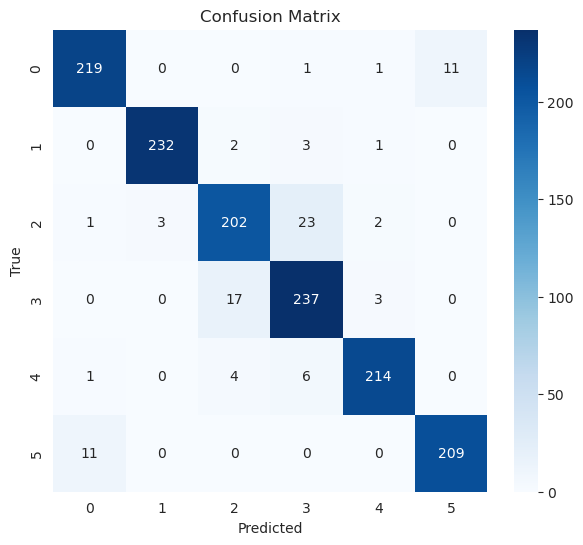

In [77]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(7,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()


NameError: name 'all_logits' is not defined

: 